In [2]:
import sys
from pathlib import Path 
p = Path(__name__).resolve().parents[2]
sys.path.append(p.__str__())
from utils.dataset import ProcessedDataset
from utils.dna import Genes
from pathlib import Path

import numpy as np 
import pandas as pd 
from tqdm import tqdm

In [3]:
DATA_DIR = Path().absolute().parents[1] / 'data'
dataset_name = 'dataset_2024_04_07'
DATASET_DIR = DATA_DIR / dataset_name
DATASET_DIR_EMEDDINGS = DATA_DIR / (dataset_name + '_embeddings')

In [53]:
for f in DATASET_DIR_EMEDDINGS.rglob("embeddings*.npy"):
    a = np.load(f)
    print(f, a.shape)

/Users/maciej.czyjt/priv-dev/prompt2avatar/data/dataset_2024_04_07_embeddings/embeddings_arcface_r100.npy (30332, 512)
/Users/maciej.czyjt/priv-dev/prompt2avatar/data/dataset_2024_04_07_embeddings/embeddings_deepfacev2.npy (30332, 4096)
/Users/maciej.czyjt/priv-dev/prompt2avatar/data/dataset_2024_04_07_embeddings/embeddings_cosface_r100.npy (30332, 512)
/Users/maciej.czyjt/priv-dev/prompt2avatar/data/dataset_2024_04_07_embeddings/embeddings_casia-webface.npy (30332, 512)
/Users/maciej.czyjt/priv-dev/prompt2avatar/data/dataset_2024_04_07_embeddings/embeddings_cosface_r18.npy (30332, 512)
/Users/maciej.czyjt/priv-dev/prompt2avatar/data/dataset_2024_04_07_embeddings/embeddings_cosface_r34.npy (30332, 512)
/Users/maciej.czyjt/priv-dev/prompt2avatar/data/dataset_2024_04_07_embeddings/embeddings_vggface2.npy (30332, 512)
/Users/maciej.czyjt/priv-dev/prompt2avatar/data/dataset_2024_04_07_embeddings/embeddings_arcface_r50.npy (30332, 512)
/Users/maciej.czyjt/priv-dev/prompt2avatar/data/dataset

In [56]:
dataset = ProcessedDataset(DATASET_DIR_EMEDDINGS)

100%|██████████| 12/12 [00:00<00:00, 22.41it/s]


## TODO:
Not all of the dnas have generated images.

In [4]:
images_fnames = list(DATA_DIR.glob('**/faces/*.png'))
dna_fnames = list(DATA_DIR.glob('**/dna/*.txt'))
matching_pairs = set([f.stem for f in images_fnames]) & set([f.stem for f in dna_fnames])
print(f"# of images: {len(images_fnames)}")
print(f"# of dna files: {len(dna_fnames)}")
print(f"# of matching pairs: {len(matching_pairs)}")


# of images: 14135
# of dna files: 14338
# of matching pairs: 9758


# Load matching embedding, dna pairs

In [16]:
# def load_all_dna(dataset_dir: Path) -> dict[str, Genes]:
#     dna_files = list(dataset_dir.glob('**/dna/*.txt'))
#     return {dna_file.stem: Genes.from_ck_string(open(dna_file, 'r').read()) for dna_file in tqdm(dna_files)}

# def find_matching_image(dna_file: Path, dataset_dir: Path) -> Path | None:
#     file_name = dna_file.stem
#     return next(dataset_dir.glob(f'**/faces/{file_name}.*'), None)

# dnas = []#load_all_dna(DATASET_DIR)

In [17]:
# matching_files = np.array([Path(path).stem in dnas for path in dataset.paths])
# print(f"% embeddings that has corresponding dna file: {matching_files.mean() * 100:.2f}%")

# matching_dnas = []
# for embedded_image_fname in dataset.paths:
#     fname = Path(embedded_image_fname).stem
#     if fname in dnas:
#         matching_dnas.append(dnas[fname])

### genes stats

In [18]:
matching_dnas = dataset.dna
sub_genes = [set(dna.flatten().keys()) for dna in matching_dnas]
all_genes = set.union(*sub_genes)
common_genes = set.intersection(*sub_genes)
diff_genes = all_genes - common_genes
print(f"Total number of sub genes: {len(all_genes)}")
print(f"Number of common genes: {len(common_genes)}")
print(f"Number of different genes: {len(diff_genes)}")

Total number of sub genes: 174
Number of common genes: 95
Number of different genes: 79


In [19]:
common_genes

{'clothes.western_bedchamber',
 'expression_other.cheek_wrinkles_both_01',
 'eye_accessory.normal_eyes',
 'eye_color[0]',
 'eye_color[1]',
 'eye_color[2]',
 'eye_color[3]',
 'eyelashes_accessory.normal_eyelashes',
 'face_detail_eye_lower_lid_def.eye_lower_lid_def',
 'face_detail_nose_ridge_def.nose_ridge_def_pos',
 'face_detail_nose_tip_def.nose_tip_def',
 'face_detail_temple_def.temple_def',
 'gene_baldness.male_pattern_baldness',
 'gene_bs_bust.bust_clothes',
 'gene_bs_cheek_forward.cheek_forward_pos',
 'gene_bs_cheek_height.cheek_height_pos',
 'gene_bs_cheek_width.cheek_width_pos',
 'gene_bs_ear_angle.ear_angle_pos',
 'gene_bs_ear_inner_shape.ear_inner_shape_pos',
 'gene_bs_ear_outward.ear_outward_pos',
 'gene_bs_ear_size.ear_size_pos',
 'gene_bs_eye_corner_depth.eye_corner_depth_pos',
 'gene_bs_eye_fold_shape.eye_fold_shape_pos',
 'gene_bs_eye_size.eye_size_pos',
 'gene_bs_eye_upper_lid_size.eye_upper_lid_size_pos',
 'gene_bs_forehead_brow_curve.forehead_brow_curve_pos',
 'gene_bs_

In [20]:
diff_genes

{'complexion.complexion_1',
 'complexion.complexion_2',
 'complexion.complexion_3',
 'complexion.complexion_4',
 'complexion.complexion_5',
 'complexion.complexion_6',
 'complexion.complexion_7',
 'expression_brow_wrinkles.brow_wrinkles_01',
 'expression_brow_wrinkles.brow_wrinkles_02',
 'expression_brow_wrinkles.brow_wrinkles_03',
 'expression_brow_wrinkles.brow_wrinkles_04',
 'expression_eye_wrinkles.eye_wrinkles_01',
 'expression_eye_wrinkles.eye_wrinkles_02',
 'expression_eye_wrinkles.eye_wrinkles_03',
 'expression_forehead_wrinkles.forehead_wrinkles_01',
 'expression_forehead_wrinkles.forehead_wrinkles_02',
 'expression_forehead_wrinkles.forehead_wrinkles_03',
 'face_detail_cheek_def.cheek_def_01',
 'face_detail_cheek_def.cheek_def_02',
 'face_detail_cheek_fat.cheek_fat_01_pos',
 'face_detail_cheek_fat.cheek_fat_02_pos',
 'face_detail_cheek_fat.cheek_fat_03_pos',
 'face_detail_cheek_fat.cheek_fat_04_pos',
 'face_detail_chin_cleft.chin_cleft',
 'face_detail_chin_cleft.chin_dimple',

### Vectorize dna

In [21]:
genes_to_use = sorted(common_genes)
vectorized_dnas = np.array([dna.asarray(keys=genes_to_use) for dna in matching_dnas])

In [22]:
vectorized_dnas.shape

(30332, 95)

# Correlation between genes and face features

In [23]:
# get embeddings of files that we have dna for
model2embeddings = dataset.model2normalized_embeddings

In [24]:
assert len(vectorized_dnas) == len(matching_dnas)
assert len(vectorized_dnas[0]) == len(genes_to_use)
assert dataset.paths.shape[0] == dataset.alligned_images.shape[0]
assert all([len(model2embeddings[model_name]) == len(vectorized_dnas) for model_name in model2embeddings])

In [34]:
from itertools import product
import numpy as np
import scipy.stats as stats
from sklearn.cross_decomposition import CCA
from sklearn.metrics import mutual_info_score, mean_squared_error
from sklearn.linear_model import LinearRegression
from itertools import product
from tqdm import tqdm
import os
# calculate correlation between genes and embeddings for each model
def corr2_coeff(A, B):
    # Rowwise mean of input arrays & subtract from input arrays themeselves
    A_mA = A - A.mean(1)[:, None]
    B_mB = B - B.mean(1)[:, None]

    # Sum of squares across rows
    ssA = (A_mA**2).sum(1)
    ssB = (B_mB**2).sum(1)

    # Finally get corr coeff
    return np.dot(A_mA, B_mB.T) / np.sqrt(np.dot(ssA[:, None],ssB[None]))

def pearson_correlation_matrix(A, B):
    A_mA = A - A.mean(axis=0, keepdims=True)  # Subtract column-wise mean
    B_mB = B - B.mean(axis=0, keepdims=True)

    ssA = (A_mA**2).sum(axis=0)
    ssB = (B_mB**2).sum(axis=0)

    return np.dot(A_mA.T, B_mB) / np.sqrt(np.dot(ssA[:, None], ssB[None, :]))

import scipy.stats as stats

def spearman_correlation_matrix(A, B):
    return stats.spearmanr(A, B)

from sklearn.metrics import mutual_info_score

# def mutual_information_matrix(A, B):
#     f = A.shape[1]
#     d = B.shape[1]
#     mi_matrix = np.zeros((f, d))

#     for i, j in tqdm(product(range(f), range(d)), total=f*d):
#         mi_matrix[i, j] = mutual_info_score(A[:, i], B[:, j])

#     return mi_matrix


# def cca_correlation_matrix(A, B):
#     f = A.shape[1]
#     d = B.shape[1]
#     cca = CCA(n_components=min(f, d))
#     A_c, B_c = cca.fit_transform(A, B)
#     # Compute the correlations between the canonical components
#     corr_matrix = np.corrcoef(A_c.T, B_c.T)[:f, f:]
#     return corr_matrix


from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

def mse_matrix(A, B):
    f = A.shape[1]  # Number of facial features
    mse_values = np.zeros(f)  # Initialize the MSE vector to store MSE for each facial feature
    
    for i in tqdm(range(f), total=f):  # Iterate over each facial feature in A
        reg = LinearRegression().fit(B, A[:, i])  # Train model to predict the i-th facial feature using all dimensions in B
        pred = reg.predict(B)  # Predict the i-th facial feature
        mse_values[i] = mean_squared_error(A[:, i], pred)  # Calculate the MSE for the i-th facial feature
    
    return mse_values 

import scipy.stats as stats

# def normalized_mutual_information_matrix(A, B):
#     f = A.shape[1]
#     d = B.shape[1]
#     nmi_matrix = np.zeros((f, d))

#     for i, j in tqdm(product(range(f), range(d)), total=f*d):
#         mi = mutual_info_score(A[:, i], B[:, j])
#         h_A = stats.entropy(np.histogram(A[:, i])[0])
#         h_B = stats.entropy(np.histogram(B[:, j])[0])
#         nmi_matrix[i, j] = 2 * mi / (h_A + h_B)
    
#     return nmi_matrix


# model2correlations = {}
# for model_name, embeddings in tqdm(model2embeddings.items()):
#     model2correlations[model_name] = mse_matrix(vectorized_dnas, embeddings)

## Remove genes that have constant values

In [25]:
from sklearn.preprocessing import minmax_scale

vectorized_dnas_scaled = minmax_scale(vectorized_dnas)

In [30]:
ok_index = []
for i, gen_name in zip(range(len(vectorized_dnas_scaled)), common_genes):
    a = vectorized_dnas_scaled[:, i]
    if np.all(np.isclose(a[0], a)):
        print(gen_name)
    else: 
        ok_index.append(i)

vectorized_dnas_scaled_filtered = vectorized_dnas_scaled[:, ok_index]

gene_bs_nose_ridge_width.nose_ridge_width_pos
hair_color[2]
gene_bs_mouth_lower_lip_full.mouth_lower_lip_full_pos


In [45]:
92 + 512

604

In [43]:
spearman_correlation_matrix(vectorized_dnas_scaled_filtered, dataset.model2normalized_embeddings["arcface-r100"])[0].shape

(604, 604)

In [57]:

from pathlib import Path
import numpy as np

def compute_and_save_metrics(A, B, output_dir):
    # Define output directory using pathlib
    output_dir.mkdir(parents=True, exist_ok=True)

    # Pearson Correlation
    pearson_corr = pearson_correlation_matrix(A, B)
    np.save(output_dir / 'pearson_corr.npy', pearson_corr)
    
    # Spearman Correlation
    spearman_corr = spearman_correlation_matrix(A, B)
    np.save(output_dir / 'spearman_corr.npy', spearman_corr)
    
    # # CCA Correlation
    # cca_corr = cca_correlation_matrix(A, B)
    # np.save(output_dir / 'cca_corr.npy', cca_corr)
    
    # # Mutual Information
    # mi_matrix = mutual_information_matrix(A, B)
    # np.save(output_dir / 'mi_matrix.npy', mi_matrix)
    
    # MSE
    mse_values = mse_matrix(A, B)
    np.save(output_dir / 'mse_values.npy', mse_values)
    
    # # Normalized Mutual Information
    # nmi_matrix = normalized_mutual_information_matrix(A, B)
    # np.save(output_dir / 'nmi_matrix.npy', nmi_matrix)
    # print("All metrics computed and saved successfully!")


for model, embeddings in dataset.model2normalized_embeddings.items():
    if model != "clip": continue 
    metrics_dir = DATASET_DIR_EMEDDINGS / "metrics" / model 
    compute_and_save_metrics(vectorized_dnas_scaled_filtered, embeddings, metrics_dir)
    print(model)

    


100%|██████████| 92/92 [01:14<00:00,  1.23it/s]

clip


# Pearson correlation

Correlation matrix for arcface-r100


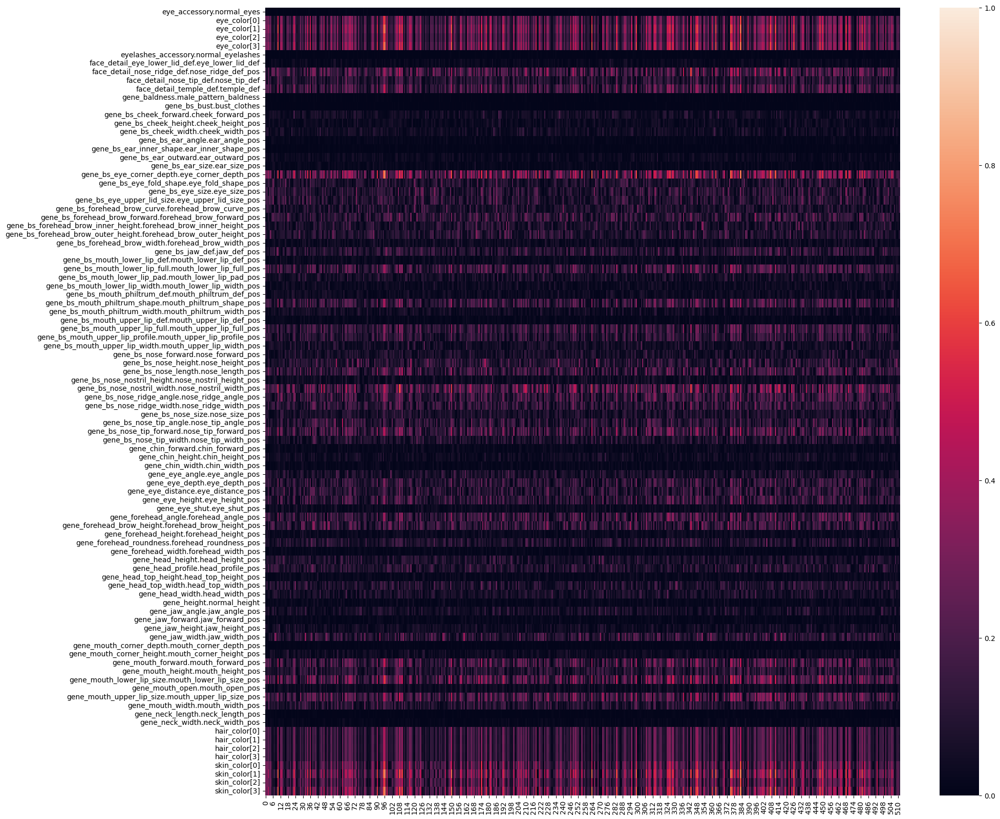

Correlation matrix for deepfacev2


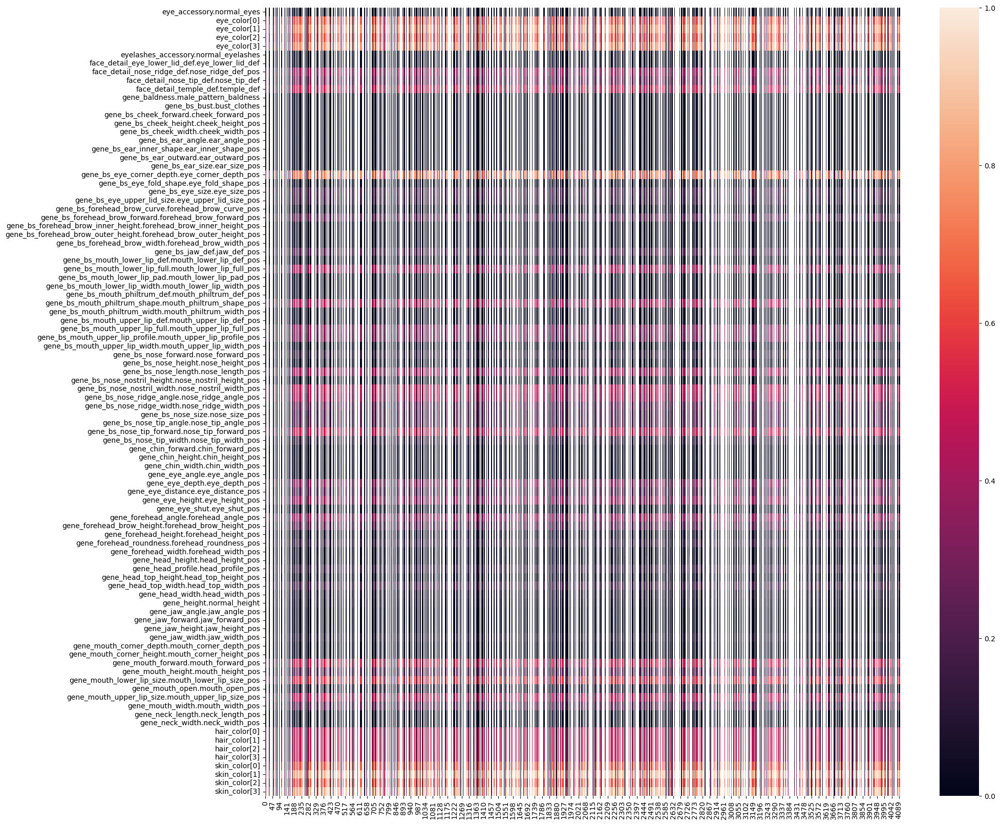

Correlation matrix for cosface-r100


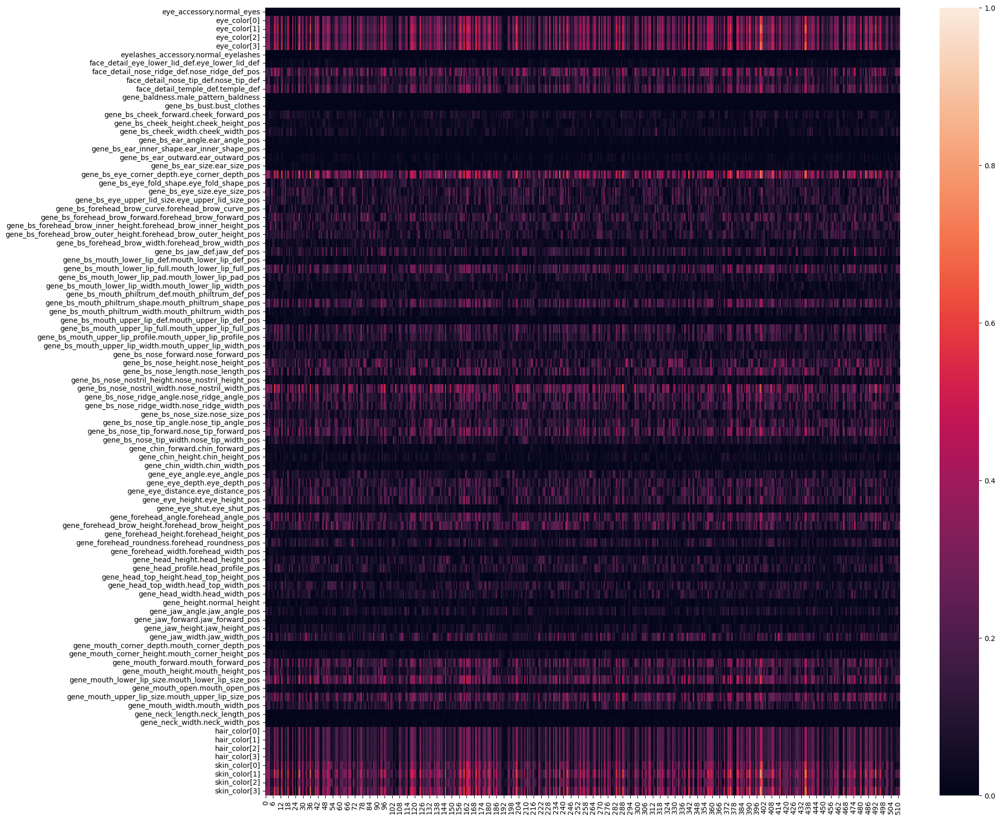

Correlation matrix for casia-webface


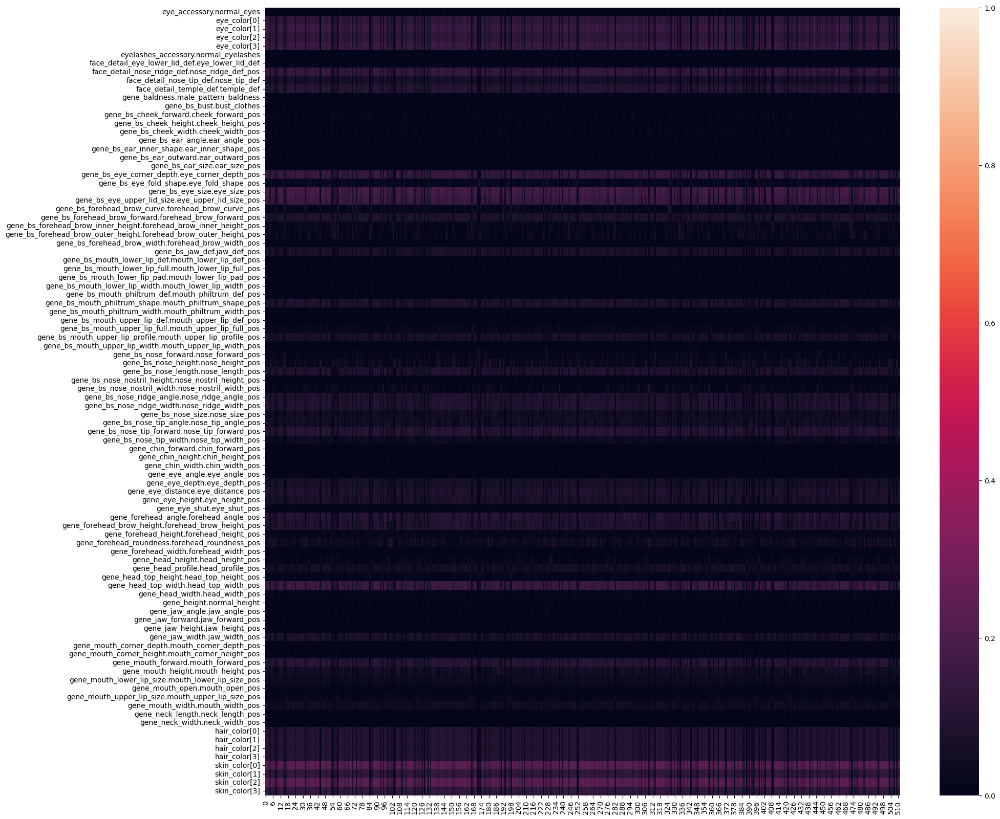

Correlation matrix for cosface-r18


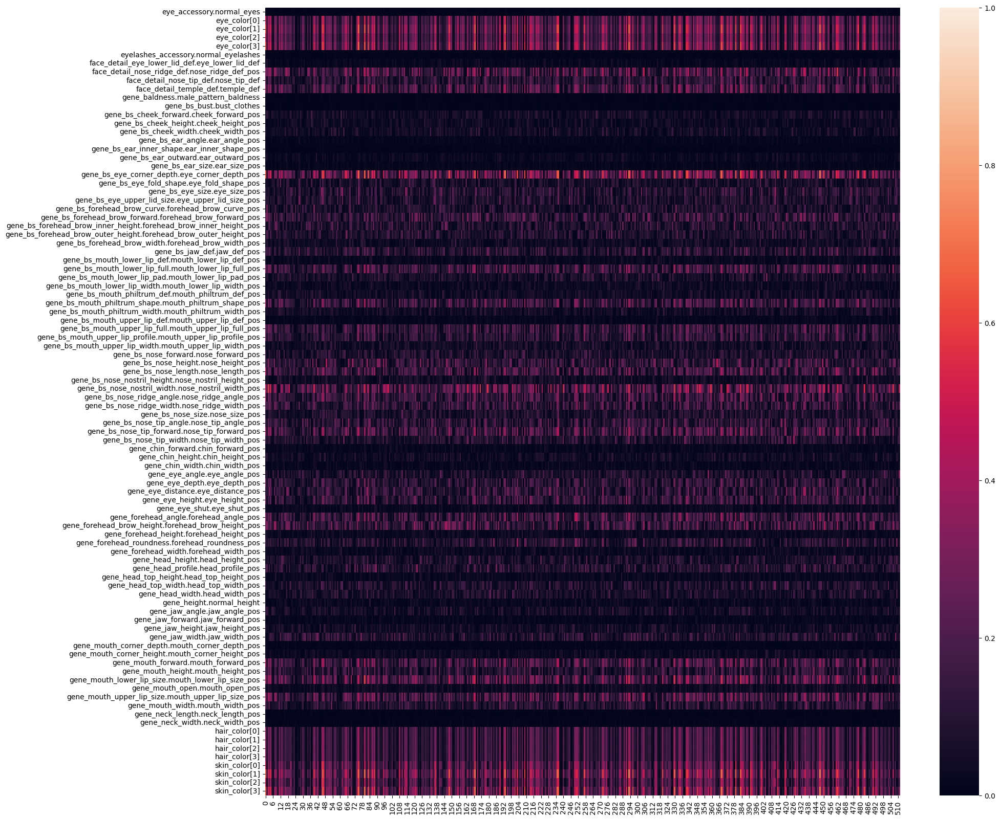

Correlation matrix for cosface-r34


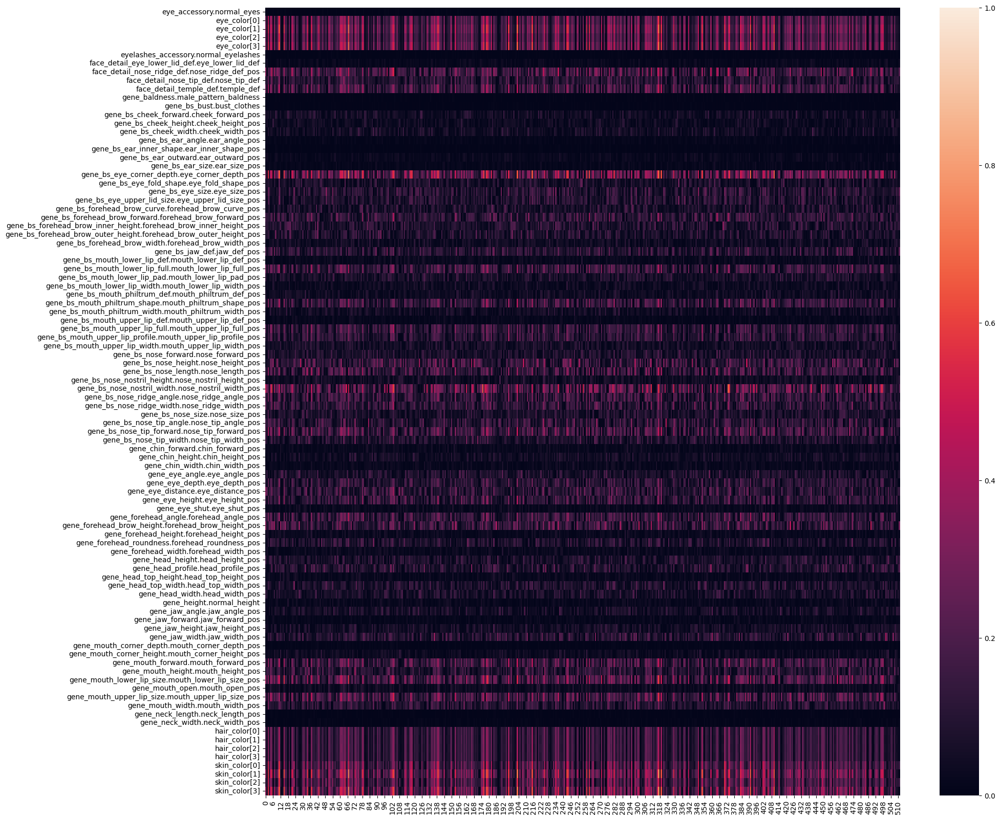

Correlation matrix for vggface2


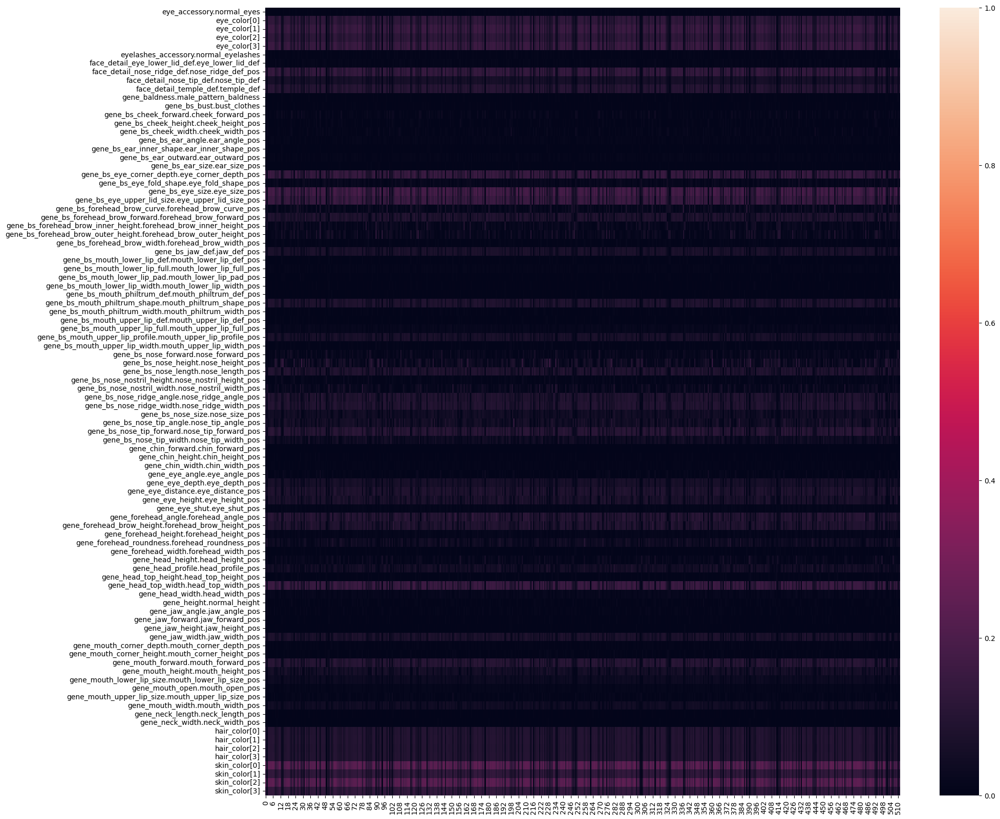

Correlation matrix for arcface-r50


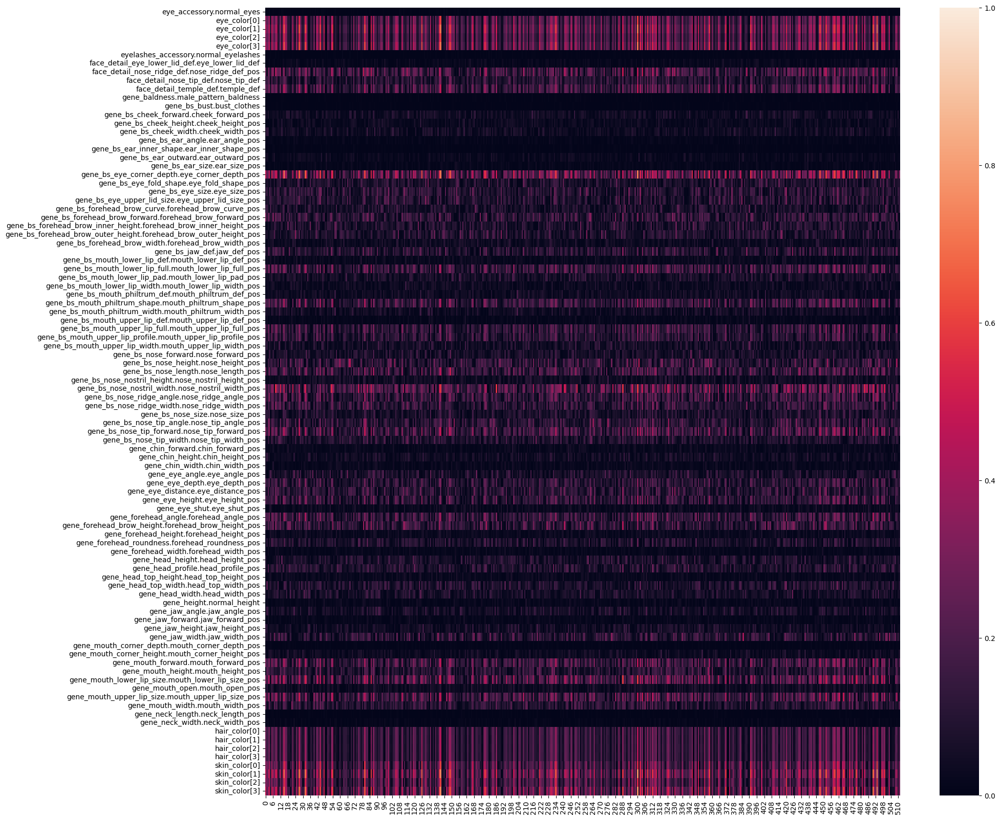

Correlation matrix for clip


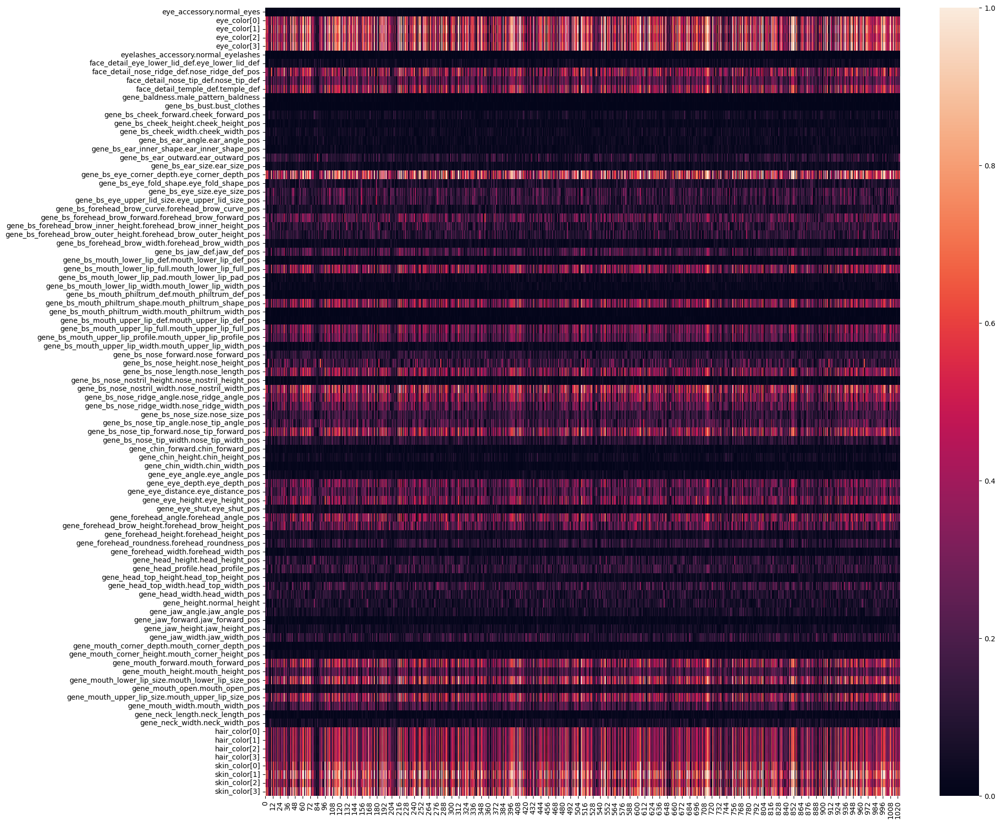

Correlation matrix for cosface-r50


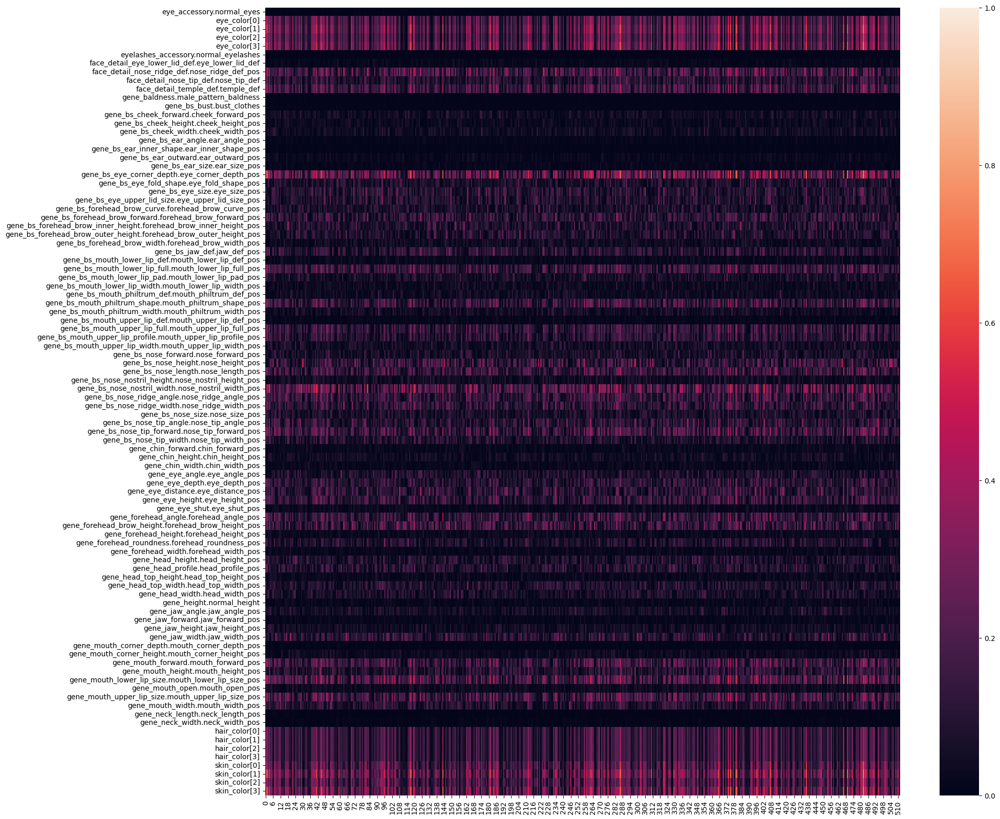

Correlation matrix for arcface-r34


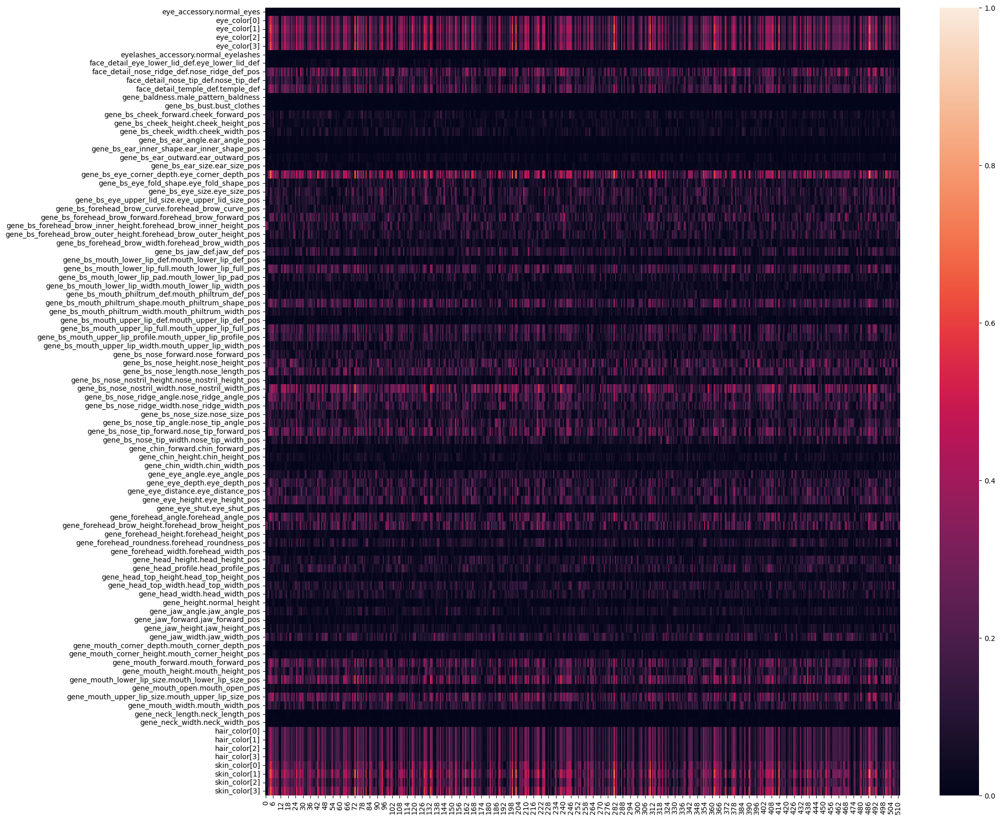

Correlation matrix for arcface-r18


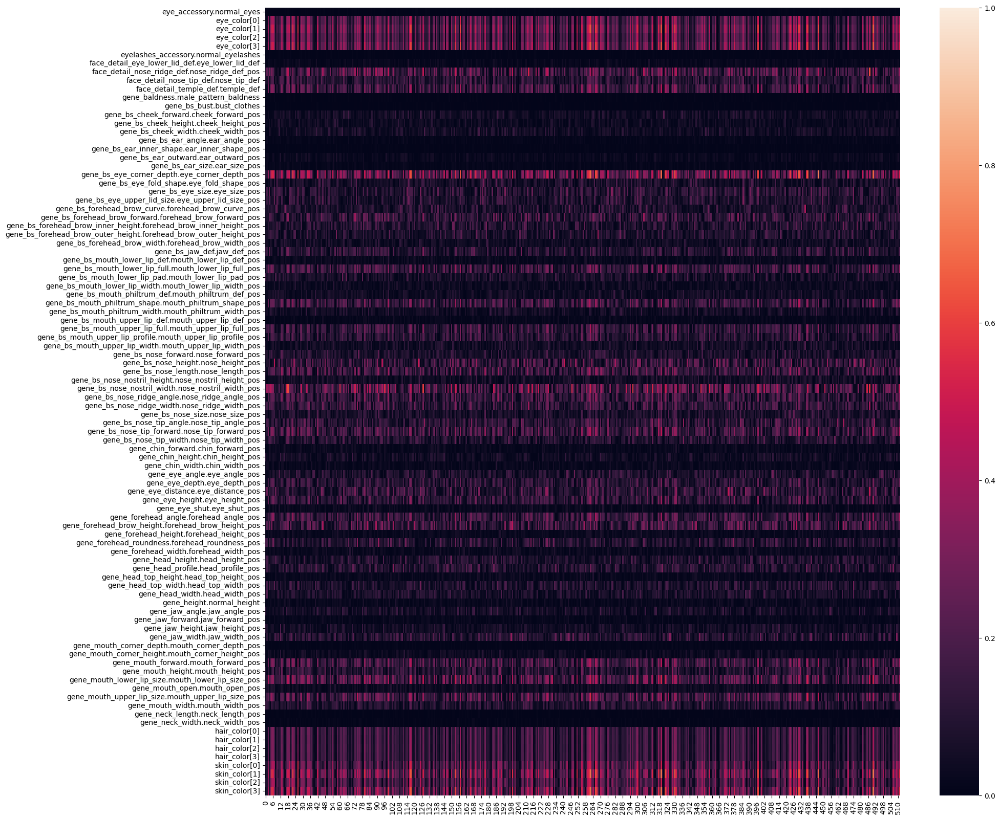

In [59]:
# display correlation matrix for each model
import seaborn as sns
import matplotlib.pyplot as plt

genes_to_use_filtered = [genes_to_use[i] for i in ok_index]
for model in dataset.model2embeddings:
    metric_dir = DATASET_DIR_EMEDDINGS / "metrics" / model / "pearson_corr.npy"
    matrix = np.load(metric_dir)
    plt.figure(figsize=(20, 20))
    sns.heatmap(np.abs(matrix), yticklabels=genes_to_use_filtered, vmin=0, vmax=1)
    print(f"Correlation matrix for {model}")
    plt.show()

# Spearman correlation

(92, 512)
Correlation matrix for arcface-r100


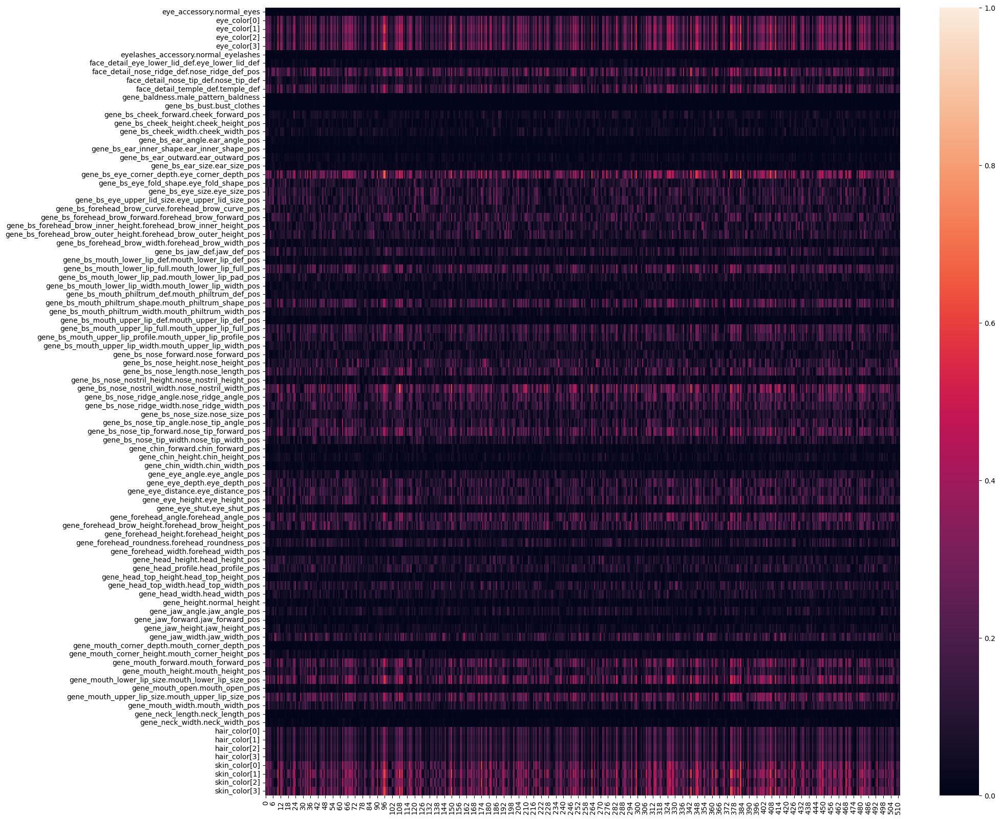

(92, 4096)
Correlation matrix for deepfacev2


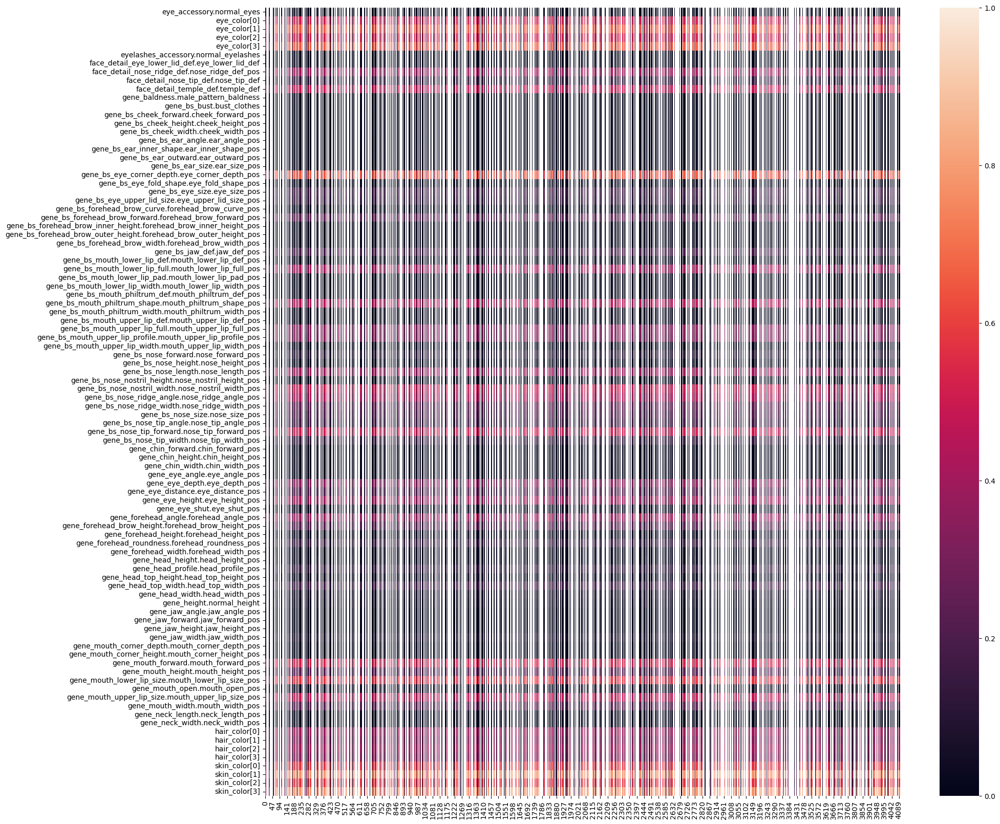

(92, 512)
Correlation matrix for cosface-r100


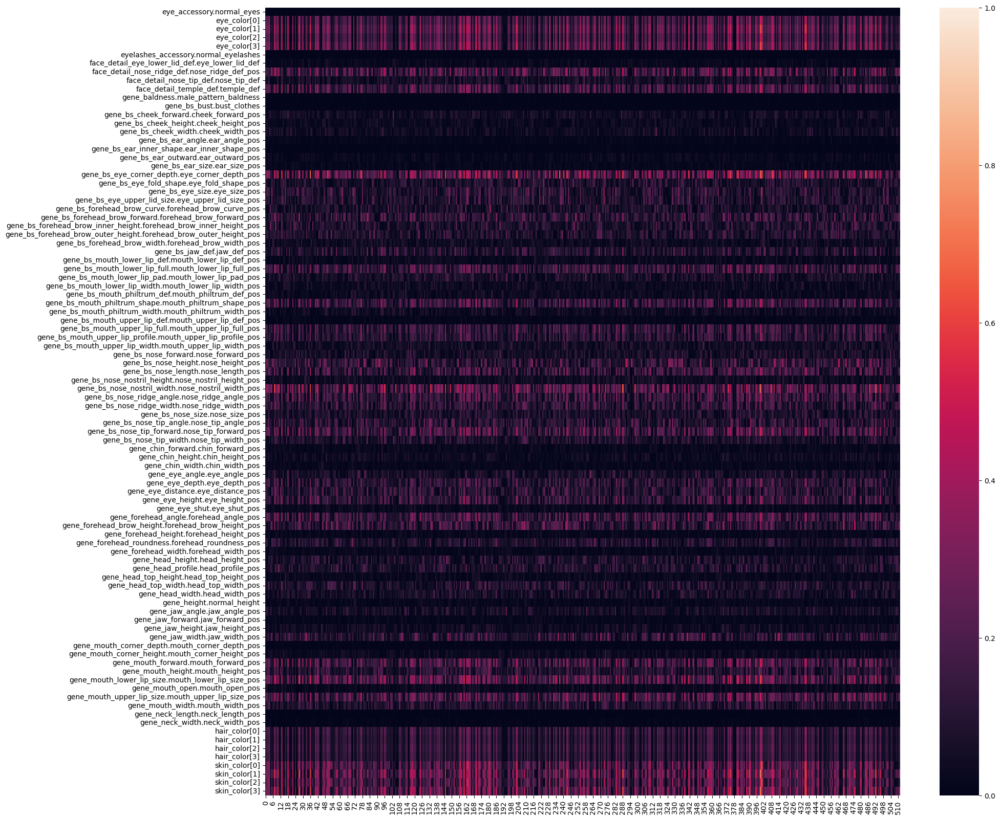

(92, 512)
Correlation matrix for casia-webface


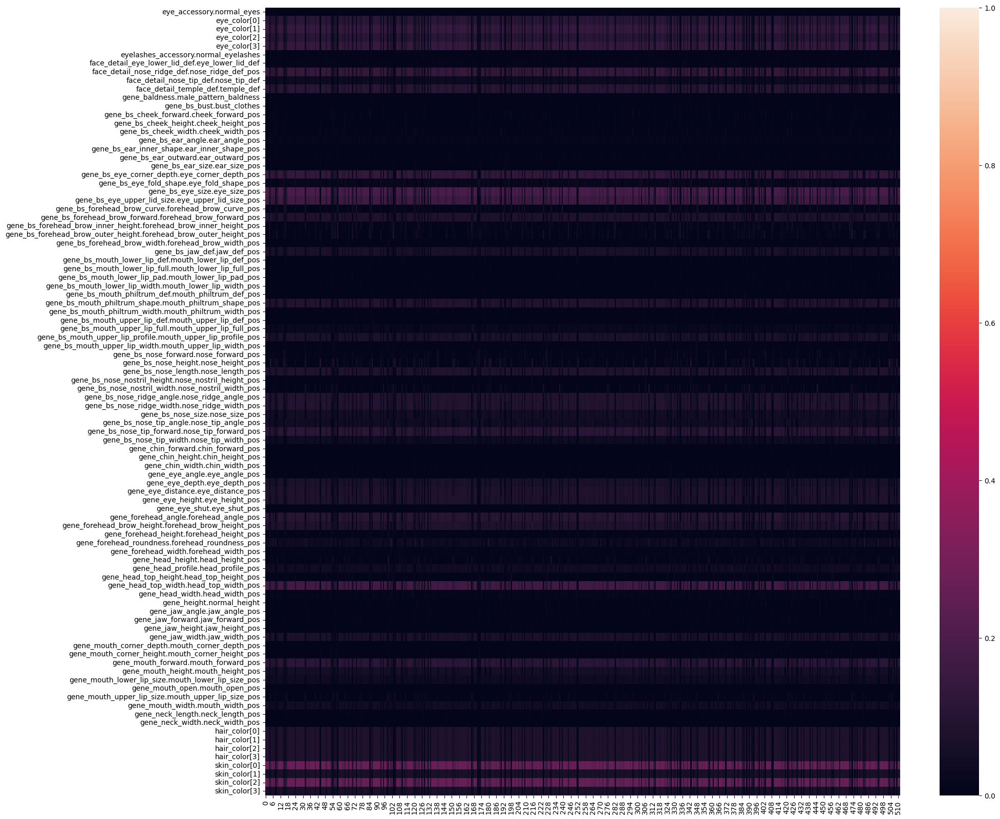

(92, 512)
Correlation matrix for cosface-r18


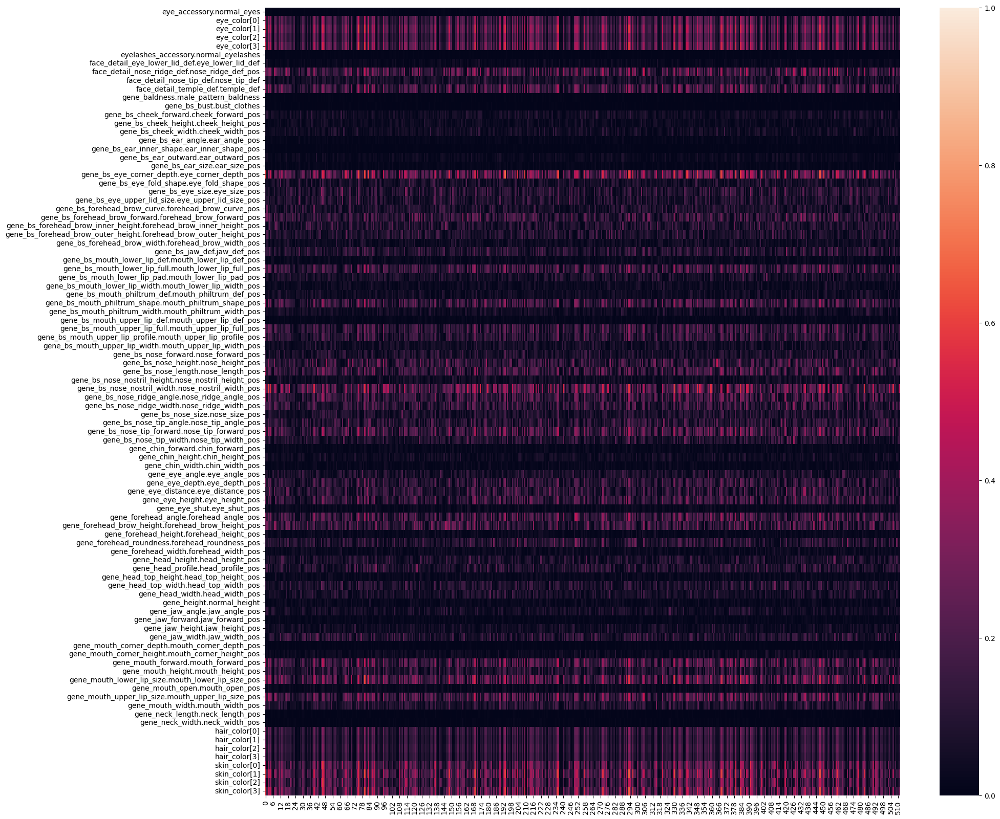

(92, 512)
Correlation matrix for cosface-r34


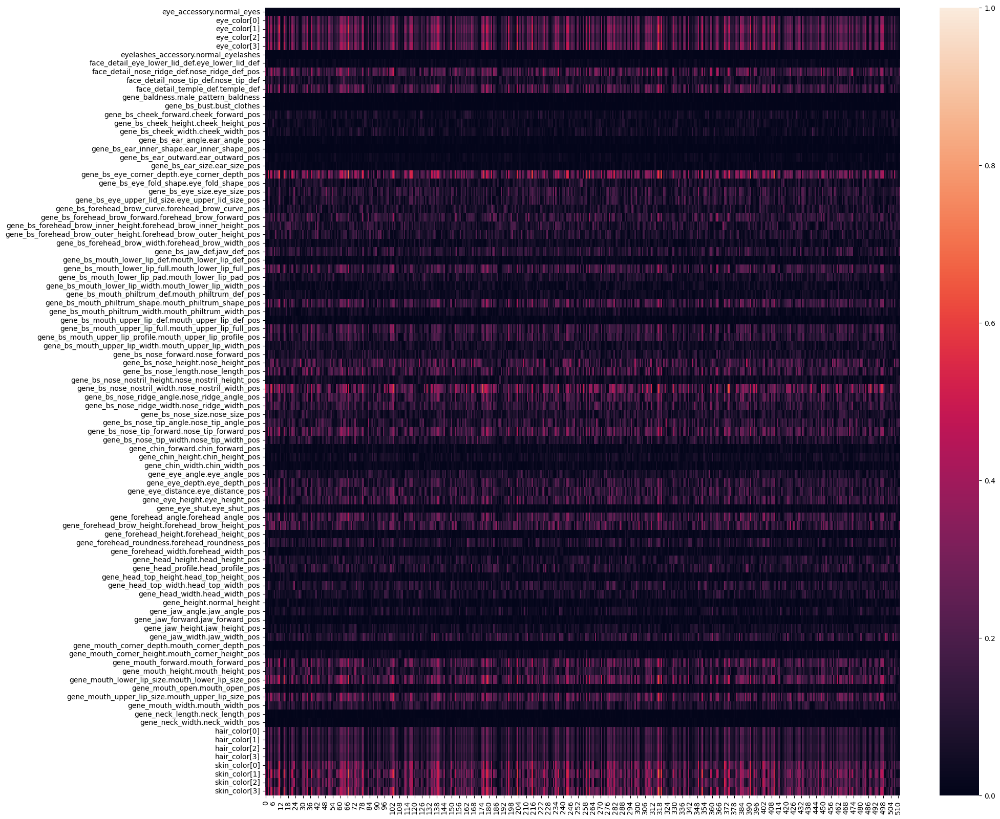

(92, 512)
Correlation matrix for vggface2


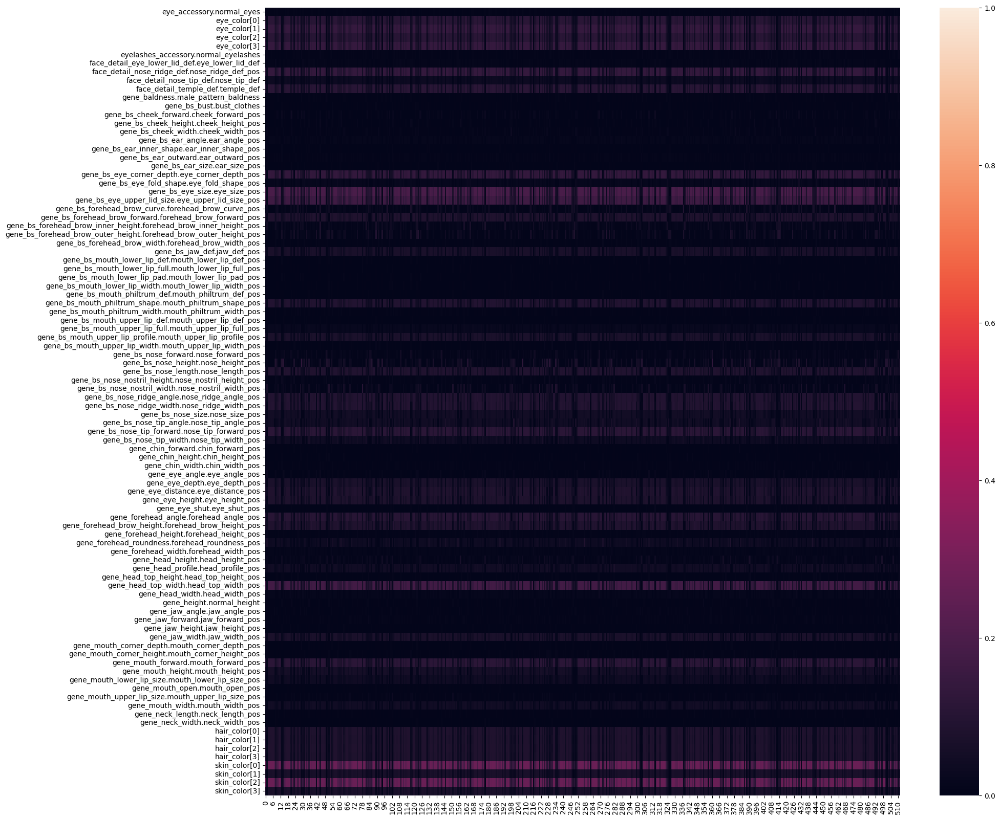

(92, 512)
Correlation matrix for arcface-r50


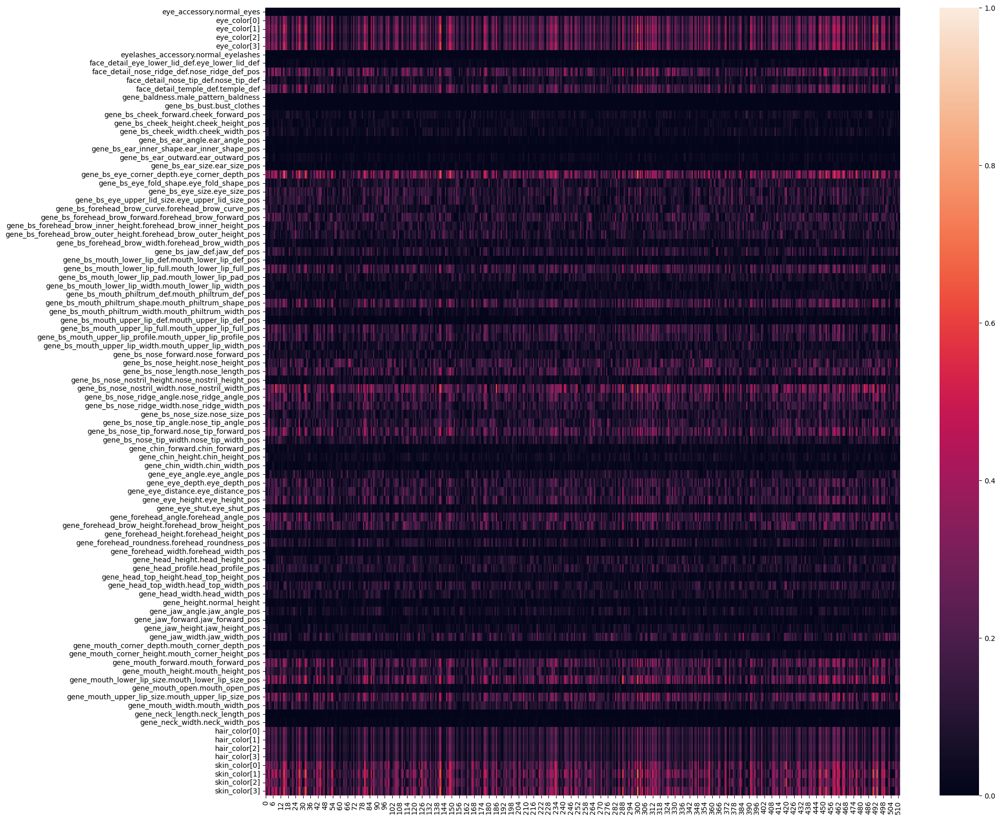

(92, 1024)
Correlation matrix for clip


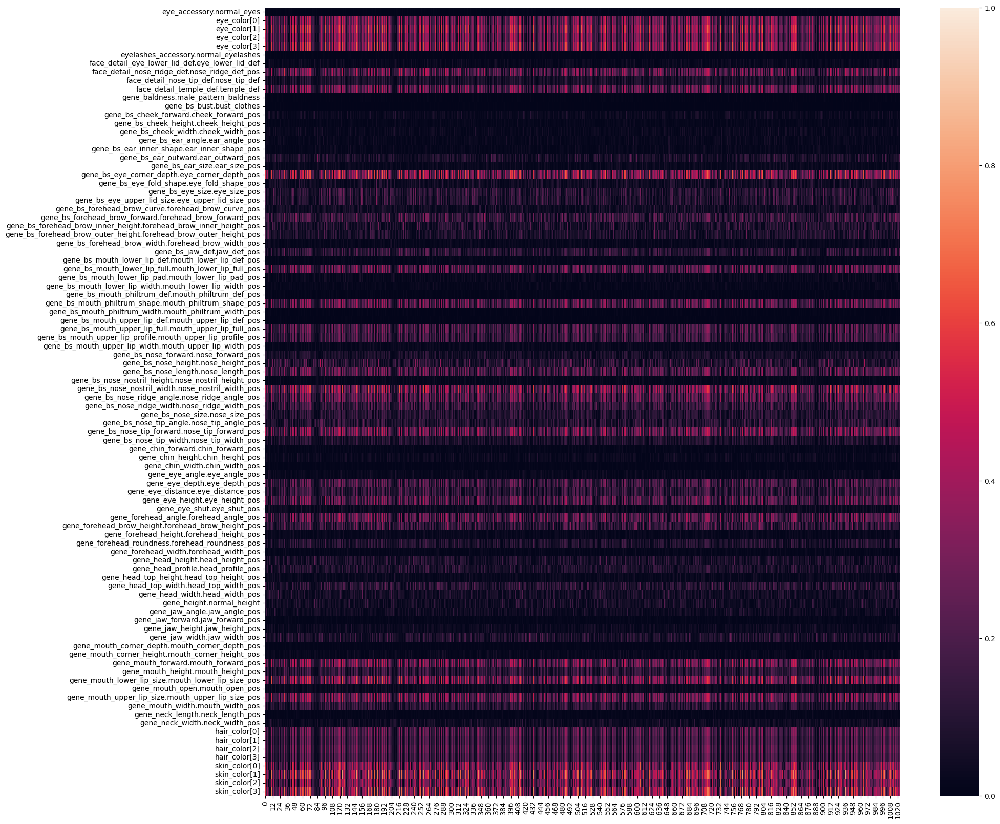

(92, 512)
Correlation matrix for cosface-r50


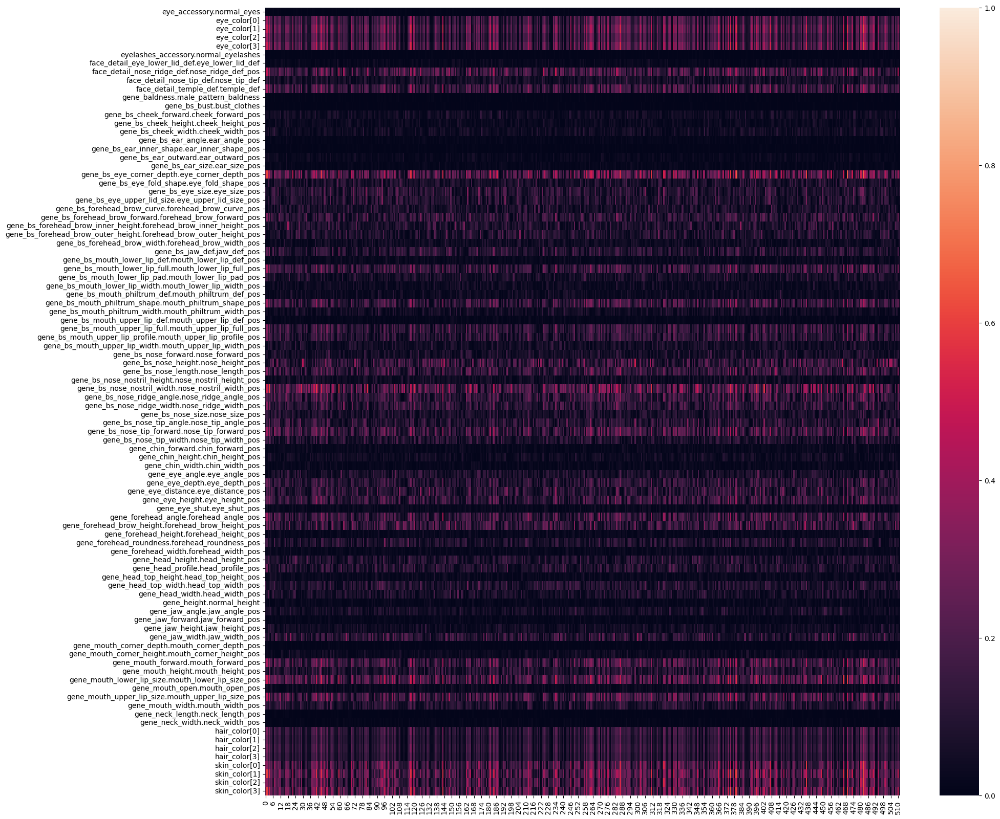

(92, 512)
Correlation matrix for arcface-r34


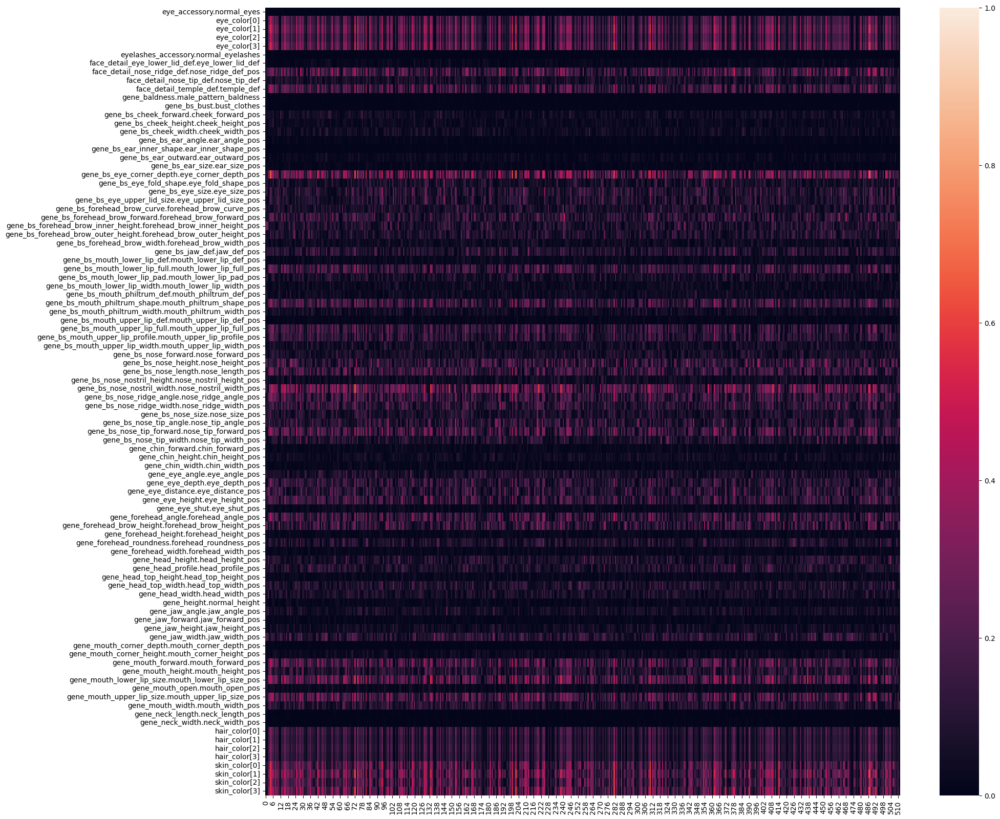

(92, 512)
Correlation matrix for arcface-r18


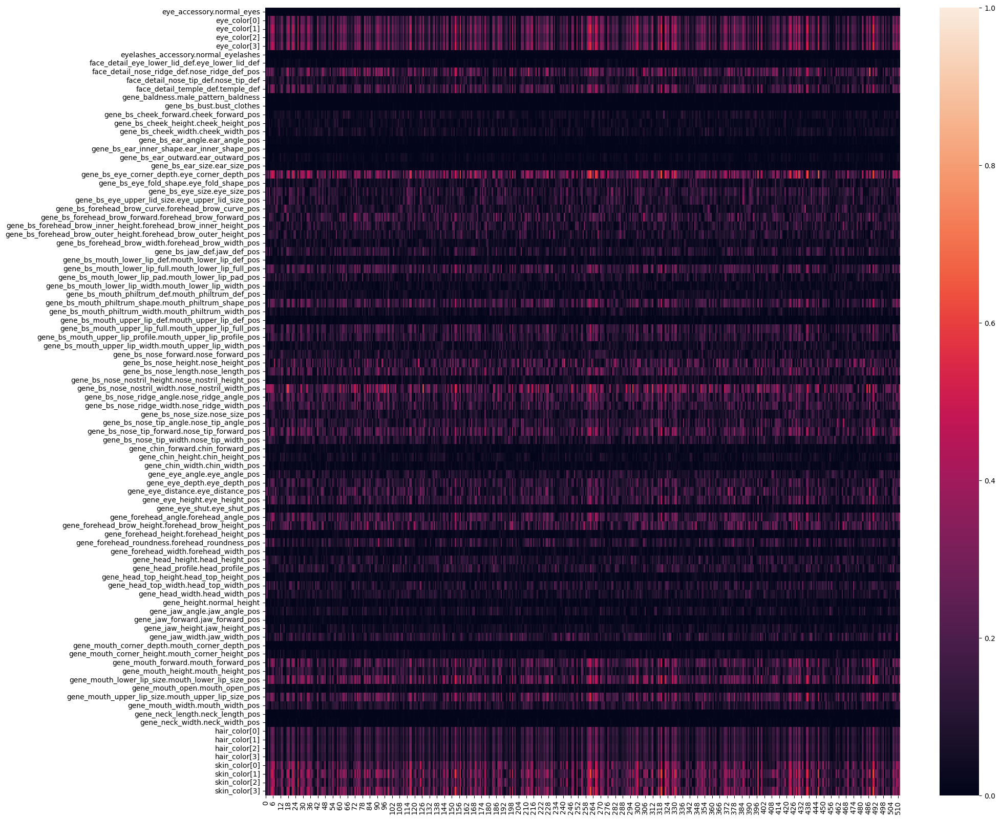

In [58]:
# display correlation matrix for each model
import seaborn as sns
import matplotlib.pyplot as plt

genes_to_use_filtered = [genes_to_use[i] for i in ok_index]
for model in dataset.model2embeddings:
    metric_dir = DATASET_DIR_EMEDDINGS / "metrics" / model / "spearman_corr.npy"
    matrix = np.load(metric_dir)[0][:92, 92:]
    print(matrix.shape)
    plt.figure(figsize=(20, 20))
    sns.heatmap(np.abs(matrix), yticklabels=genes_to_use_filtered, vmin=0, vmax=1)
    print(f"Correlation matrix for {model}")
    plt.show()

# Tables

In [62]:
# display correlation matrix for each model
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd 


def get_stats(A: np.ndarray):
    stats = {
        "mean": np.mean(A),
        "max": A.max(),
        "min": A.min()
    }
    return stats 


genes_to_use_filtered = [genes_to_use[i] for i in ok_index]
pearsonr_stats = {}
spearman_stats = {}
mse_stats = {}

for model in dataset.model2embeddings:
    dir = DATASET_DIR_EMEDDINGS / "metrics" / model 
    spearman = np.load(dir / "spearman_corr.npy")[0][:92, 92:]
    pearson = np.load(dir / "pearson_corr.npy")
    mse = np.load(dir / "mse_values.npy")

    pearsonr_stats[model] = get_stats(pearson)
    spearman_stats[model] = get_stats(spearman)
    mse_stats[model] = get_stats(mse)

from pprint import pprint

pprint(pearsonr_stats)
print()
pprint(spearman_stats)
print()
pprint(mse_stats)

pd.DataFrame.from_dict(pearsonr_stats, orient="columns")

{'arcface-r100': {'max': 0.7308108729232907,
                  'mean': 0.0015866007718937918,
                  'min': -0.7322585682790596},
 'arcface-r18': {'max': 0.7255896769375708,
                 'mean': -0.0003122622092975128,
                 'min': -0.7098253134898707},
 'arcface-r34': {'max': 0.6956011507283091,
                 'mean': -0.0007941035301518817,
                 'min': -0.7114422931748607},
 'arcface-r50': {'max': 0.7800956010145359,
                 'mean': -0.00018954792649424635,
                 'min': -0.7594694318588244},
 'casia-webface': {'max': 0.24761334295413512,
                   'mean': -0.0003047883119162167,
                   'min': -0.24697551235377513},
 'clip': {'max': 1.4778355112804562,
          'mean': -0.00039483197437840376,
          'min': -1.576641136294892},
 'cosface-r100': {'max': 0.7182557756150109,
                  'mean': 0.0009540363137796045,
                  'min': -0.7974968580682928},
 'cosface-r18': {'max': 0.723937440

KeyError: 'data'

In [66]:
combined_stats = []

for model in dataset.model2embeddings:
    combined_entry = {
        "model": model,
        "pearson_mean": pearsonr_stats[model]["mean"],
        "pearson_max": pearsonr_stats[model]["max"],
        "pearson_min": pearsonr_stats[model]["min"],
        "spearman_mean": spearman_stats[model]["mean"],
        "spearman_max": spearman_stats[model]["max"],
        "spearman_min": spearman_stats[model]["min"],
        "mse_mean": mse_stats[model]["mean"],
        "mse_max": mse_stats[model]["max"],
        "mse_min": mse_stats[model]["min"],
    }
    combined_stats.append(combined_entry)

# Convert to DataFrame
df = pd.DataFrame(combined_stats)

# Display the DataFrame
df.sort_values(by="pearson_mean", ascending=False)

,model,pearson_mean,pearson_max,pearson_min,spearman_mean,spearman_max,spearman_min,mse_mean,mse_max,mse_min
0,arcface-r100,0.001587,0.730811,-0.732259,0.001546,0.655742,-0.678129,0.015484,0.083191,0.002062
2,cosface-r100,0.000954,0.718256,-0.797497,0.000878,0.639090,-0.721098,0.013472,0.083104,0.001343
5,cosface-r34,0.000725,0.718019,-0.732426,0.000720,0.673485,-0.664878,0.013761,0.083069,0.001416
4,cosface-r18,0.000656,0.723937,-0.725966,0.000614,0.650270,-0.671465,0.013491,0.083120,0.001524
9,cosface-r50,0.000021,0.748592,-0.736321,0.000057,0.669984,-0.668672,0.013889,0.083246,0.001499
7,arcface-r50,-0.000190,0.780096,-0.759469,-0.000175,0.695620,-0.690765,0.015296,0.083270,0.001895
6,vggface2,-0.000239,0.247174,-0.246363,-0.000230,0.270779,-0.270768,0.039341,0.114608,0.010868
3,casia-webface,-0.000305,0.247613,-0.246976,-0.000293,0.270754,-0.270800,0.039256,0.114597,0.010842
11,arcface-r18,-0.000312,0.725590,-0.709825,-0.000284,0.697786,-0.628257,0.013917,0.083123,0.001522
8,clip,-0.000395,1.477836,-1.576641,-0.000193,0.823609,-0.800010,0.016121,0.081703,0.000573
